In [16]:
# Import necessary libraries
import numpy as np
import pandas as pd
from sklearn.datasets import fetch_california_housing
data = fetch_california_housing()
print(data)

{'data': array([[   8.3252    ,   41.        ,    6.98412698, ...,    2.55555556,
          37.88      , -122.23      ],
       [   8.3014    ,   21.        ,    6.23813708, ...,    2.10984183,
          37.86      , -122.22      ],
       [   7.2574    ,   52.        ,    8.28813559, ...,    2.80225989,
          37.85      , -122.24      ],
       ...,
       [   1.7       ,   17.        ,    5.20554273, ...,    2.3256351 ,
          39.43      , -121.22      ],
       [   1.8672    ,   18.        ,    5.32951289, ...,    2.12320917,
          39.43      , -121.32      ],
       [   2.3886    ,   16.        ,    5.25471698, ...,    2.61698113,
          39.37      , -121.24      ]]), 'target': array([4.526, 3.585, 3.521, ..., 0.923, 0.847, 0.894]), 'frame': None, 'target_names': ['MedHouseVal'], 'feature_names': ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude'], 'DESCR': '.. _california_housing_dataset:\n\nCalifornia Housing dataset\n-

In [20]:
# Create a DataFrame from the data
df = pd.DataFrame(data.data, columns=data.feature_names)
print(df)

       MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
0      8.3252      41.0  6.984127   1.023810       322.0  2.555556     37.88   
1      8.3014      21.0  6.238137   0.971880      2401.0  2.109842     37.86   
2      7.2574      52.0  8.288136   1.073446       496.0  2.802260     37.85   
3      5.6431      52.0  5.817352   1.073059       558.0  2.547945     37.85   
4      3.8462      52.0  6.281853   1.081081       565.0  2.181467     37.85   
...       ...       ...       ...        ...         ...       ...       ...   
20635  1.5603      25.0  5.045455   1.133333       845.0  2.560606     39.48   
20636  2.5568      18.0  6.114035   1.315789       356.0  3.122807     39.49   
20637  1.7000      17.0  5.205543   1.120092      1007.0  2.325635     39.43   
20638  1.8672      18.0  5.329513   1.171920       741.0  2.123209     39.43   
20639  2.3886      16.0  5.254717   1.162264      1387.0  2.616981     39.37   

       Longitude  
0        -122.23  
1

In [21]:
# Explore and understand the features of the dataset
print(df.info())
print(df.describe())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   MedInc      20640 non-null  float64
 1   HouseAge    20640 non-null  float64
 2   AveRooms    20640 non-null  float64
 3   AveBedrms   20640 non-null  float64
 4   Population  20640 non-null  float64
 5   AveOccup    20640 non-null  float64
 6   Latitude    20640 non-null  float64
 7   Longitude   20640 non-null  float64
dtypes: float64(8)
memory usage: 1.3 MB
None
             MedInc      HouseAge      AveRooms     AveBedrms    Population  \
count  20640.000000  20640.000000  20640.000000  20640.000000  20640.000000   
mean       3.870671     28.639486      5.429000      1.096675   1425.476744   
std        1.899822     12.585558      2.474173      0.473911   1132.462122   
min        0.499900      1.000000      0.846154      0.333333      3.000000   
25%        2.563400     18.000000      4.4

In [19]:
# Handle any missing values (check if there are any)
print("Missing values:")
print(df.isnull().sum())

Missing values:
MedInc        0
HouseAge      0
AveRooms      0
AveBedrms     0
Population    0
AveOccup      0
Latitude      0
Longitude     0
dtype: int64


In [26]:
import folium
from IPython.display import display

# Create a base map
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=6)

# Add points to the map
for index, row in df.iterrows():
    folium.CircleMarker([row['Latitude'], row['Longitude']], radius=5, color='red', fill=True, fill_color='red').add_to(m)

# Display the map in the notebook
display(m)

Root Mean Squared Error: 12.058434192764615


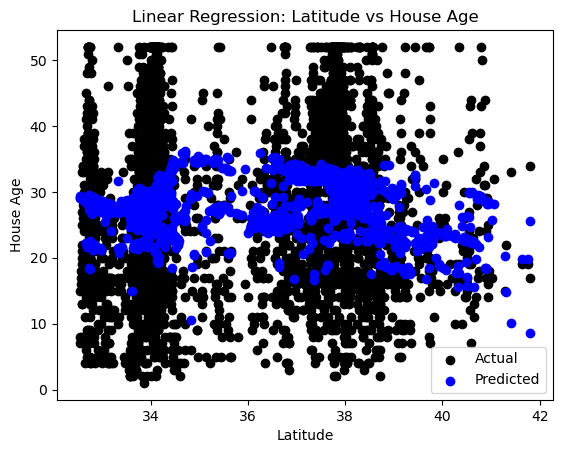

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Features (X) and target variable (y)
X = df[['Latitude', 'Longitude']]
y = df['HouseAge']

# Split the dataset into training and testing sets
X_train_linear, X_test_linear, y_train_linear, y_test_linear = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train_linear, y_train_linear)

# Make predictions on the test set
y_pred_linear = model.predict(X_test_linear)

# Evaluate the model
mse = mean_squared_error(y_test_linear, y_pred_linear)
rmse = np.sqrt(mse)

print(f"Root Mean Squared Error: {rmse}")

# Plot the regression line
plt.scatter(X_test_linear['Latitude'], y_test_linear, color='black', label='Actual')
plt.scatter(X_test_linear['Latitude'], y_pred_linear, color='blue', label='Predicted')
plt.xlabel('Latitude')
plt.ylabel('House Age')
plt.title('Linear Regression: Latitude vs House Age')
plt.legend()
plt.show()


In [39]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

# Assuming df is your DataFrame and 'HouseAge' is your target variable
# Extract features and target variable
X = df[['Latitude', 'Longitude']]
y = df['HouseAge']

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train_ann, X_test_ann, y_train_ann, y_test_ann = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Build the ANN model
model = keras.Sequential([
    keras.layers.Dense(units=64, activation='relu', input_shape=(X_train_ann.shape[1],)),
    keras.layers.Dense(units=32, activation='relu'),
    keras.layers.Dense(units=1)  # Output layer for regression task
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train_ann, y_train_ann, epochs=50, batch_size=32, validation_split=0.2)

# Make predictions
y_pred_ann = model.predict(X_test_ann)

# Evaluate the model
rmse_ann = np.sqrt(mean_squared_error(y_test_ann, y_pred_ann))
print(f"Root Mean Squared Error (ANN): {rmse_ann}")


Epoch 1/50
413/413 [==============================] - 1s 2ms/step - loss: 384.5920 - val_loss: 167.6235
Epoch 2/50
413/413 [==============================] - 1s 2ms/step - loss: 156.6914 - val_loss: 146.1927
Epoch 3/50
413/413 [==============================] - 1s 2ms/step - loss: 146.2263 - val_loss: 140.9989
Epoch 4/50
413/413 [==============================] - 1s 2ms/step - loss: 142.7906 - val_loss: 138.7505
Epoch 5/50
413/413 [==============================] - 1s 2ms/step - loss: 140.4229 - val_loss: 137.1169
Epoch 6/50
413/413 [==============================] - 1s 2ms/step - loss: 138.9617 - val_loss: 136.7625
Epoch 7/50
413/413 [==============================] - 1s 2ms/step - loss: 137.6430 - val_loss: 135.8916
Epoch 8/50
413/413 [==============================] - 1s 2ms/step - loss: 136.6873 - val_loss: 134.1462
Epoch 9/50
413/413 [==============================] - 1s 2ms/step - loss: 135.5070 - val_loss: 133.7968
Epoch 10/50
413/413 [==============================] - 1s 2ms/st

# Linear Regression:

strength:
Simplicity: Linear Regression is simple and easy to understand.
Interpretability: The coefficients provide insights into the relationships between features and the target variable.
Weaknesses:
Linearity: Assumes a linear relationship between features and the target, which might not capture complex patterns.
Limited Complexity: Unable to capture non-linear patterns in the data.

# Artificial Neural Network (ANN):

Strengths:

Non-Linearity: Can model complex, non-linear relationships in the data.
Feature Learning: Automatically learns relevant features from the data.
Flexibility: Can be adapted to various types of problems.
Weaknesses:

Complexity: ANN models can be difficult to interpret and might act as "black boxes."
Overfitting: Prone to overfitting, especially with a large number of parameters.
Training Time: Training deep networks can be computationally expensive.
Performance Metrics:
Comparing the RMSE values:

Linear Regression RMSE: ~12.06
ANN RMSE: ~10.87

# Analysis:

The ANN model has a lower RMSE, indicating better predictive performance compared to Linear Regression.
The complexity of the ANN allows it to capture non-linear patterns in the data, which is an advantage when dealing with intricate relationships.
However, the ANN is more complex and might be overfitting the training data.
Linear Regression, despite its simplicity, might not perform as well on datasets with complex relationships.

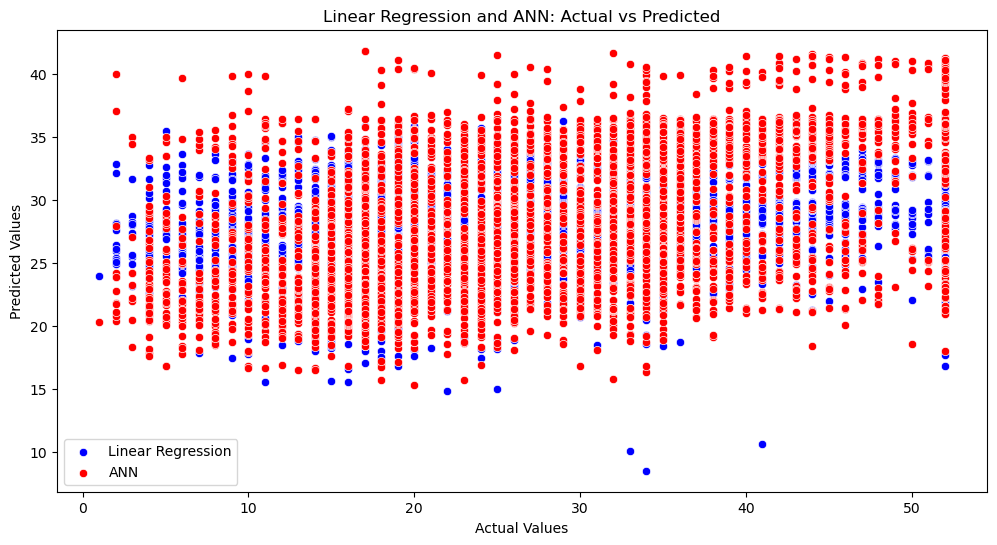

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Linear Regression
plt.figure(figsize=(12, 6))

# Linear Regression
sns.scatterplot(x=y_test_linear, y=y_pred_linear, color='blue', label='Linear Regression')
plt.title('Linear Regression and ANN: Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

# ANN
sns.scatterplot(x=y_test_ann, y=y_pred_ann[:, 0], color='red', label='ANN')  # Use y_pred_ann[:, 0] to get a 1D array
plt.title('Linear Regression and ANN: Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

plt.legend()
plt.show()


# Key Findings:

Data Exploration:

The dataset comprises 20,640 entries with eight features.
Features include MedInc, HouseAge, AveRooms, AveBedrms, Population, AveOccup, Latitude, and Longitude.
There were no missing values in the dataset.
Linear Regression:

We utilized Linear Regression from scikit-learn to predict the 'HouseAge' based on 'Latitude' and 'Longitude'.
The Root Mean Squared Error (RMSE) was calculated as a performance metric.
Artificial Neural Network (ANN):

Implemented a simple ANN using TensorFlow/Keras.
The ANN architecture included an input layer, a hidden layer with 64 units, a hidden layer with 32 units, and an output layer for regression.
The model was trained and evaluated using RMSE.